Predict Employee Attrition

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

Dataset: IBM HR Analytics Dataset
Steps:
Perform Exploratory Data Analysis (EDA) to identify key factors influencing attrition.
Train classification models such as Random Forest or Logistic Regression.
Use SHAP or LIME to explain model predictions and interpret results.
Provide actionable insights to reduce attrition.

In [2]:
data=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [3]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
data.info()         

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

After checking for missing values, the dataset appears to be complete, with no significant missing values.

In [5]:
data.shape

(1470, 35)

In [6]:
data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [7]:
data.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [8]:
attrition_percentage = data["Attrition"].value_counts(normalize=True) * 100
attrition_count = data["Attrition"].value_counts()

print(attrition_percentage)
print(attrition_count)

Attrition
No     83.877551
Yes    16.122449
Name: proportion, dtype: float64
Attrition
No     1233
Yes     237
Name: count, dtype: int64


About 16.12 % of employees have left the company which is a moderate attrition rate.

/var/folders/1q/p5sy_y5d1sq65jn9_f3p33y80000gn/T/ipykernel_1027/2146393163.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data = data, x="Attrition", palette=['#8EE5EE',"#66CDAA"])


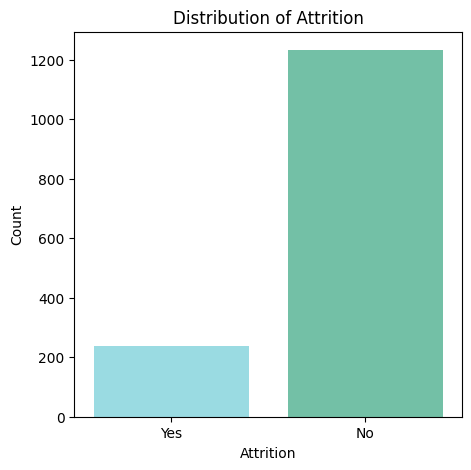

In [9]:
plt.figure(figsize=(5,5))
sns.countplot(data = data, x="Attrition", palette=['#8EE5EE',"#66CDAA"])
plt.title("Distribution of Attrition")
plt.xlabel("Attrition")
plt.ylabel("Count")
plt.show()

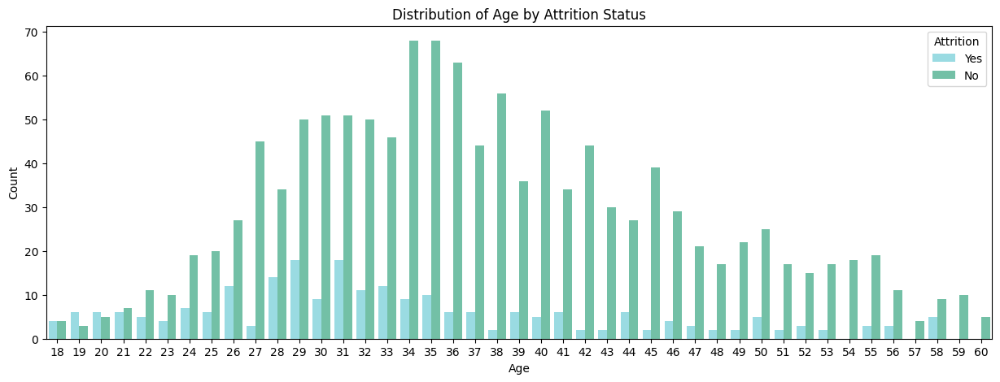

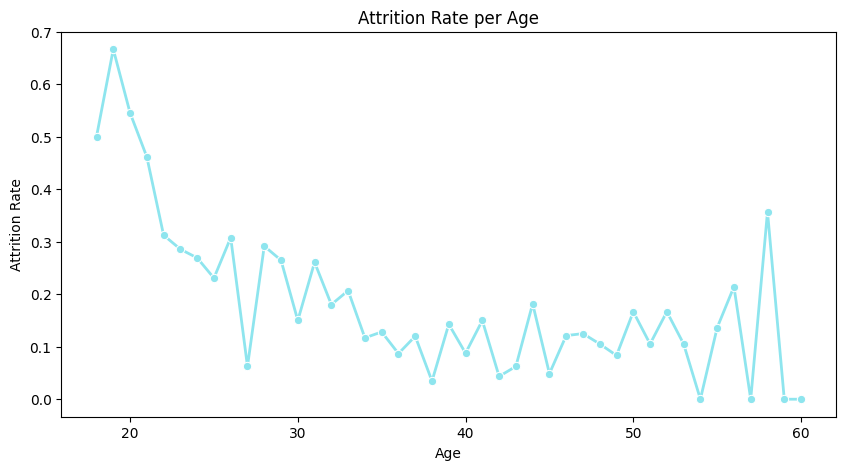

In [10]:
plt.figure(figsize=(15, 5))
sns.countplot(data=data, x="Age", hue="Attrition", palette=['#8EE5EE',"#66CDAA"])
plt.title("Distribution of Age by Attrition Status")
plt.xlabel("Age")
plt.ylabel("Count")
plt.show()

# Distribution of AttritionRate per Age
temp_df = data.copy()
temp_df['Attrition'] = temp_df['Attrition'].apply(lambda x: 1 if x == 'Yes' else 0)
age_attrition_rate = temp_df.groupby('Age')['Attrition'].mean()
plt.figure(figsize=(10, 5))
sns.lineplot(x=age_attrition_rate.index, y=age_attrition_rate.values, marker='o', color='#8EE5EE', linewidth=2)
plt.title('Attrition Rate per Age')
plt.xlabel('Age')
plt.ylabel('Attrition Rate')
plt.show()

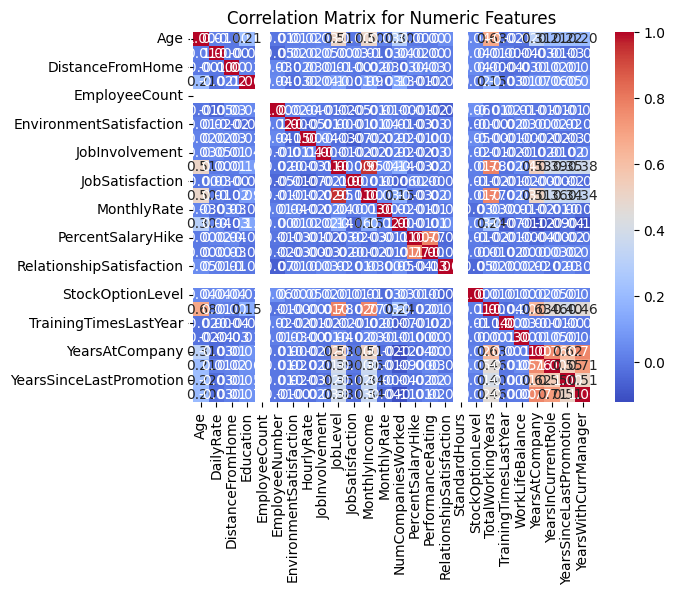

In [11]:
# Select only numeric columns
numeric_data = data.select_dtypes(include=['int64', 'float64'])

# Correlation matrix
correlation_matrix = numeric_data.corr()

# Plot the heatmap
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix for Numeric Features')
plt.show()


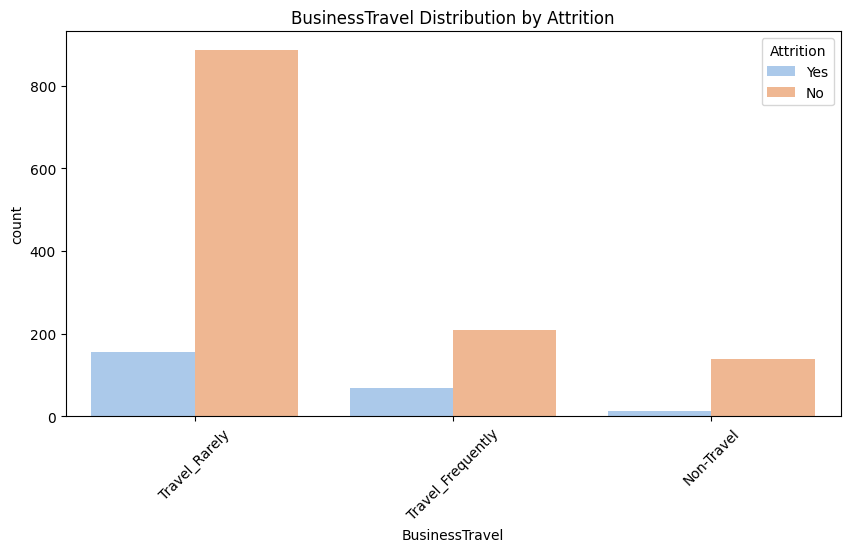

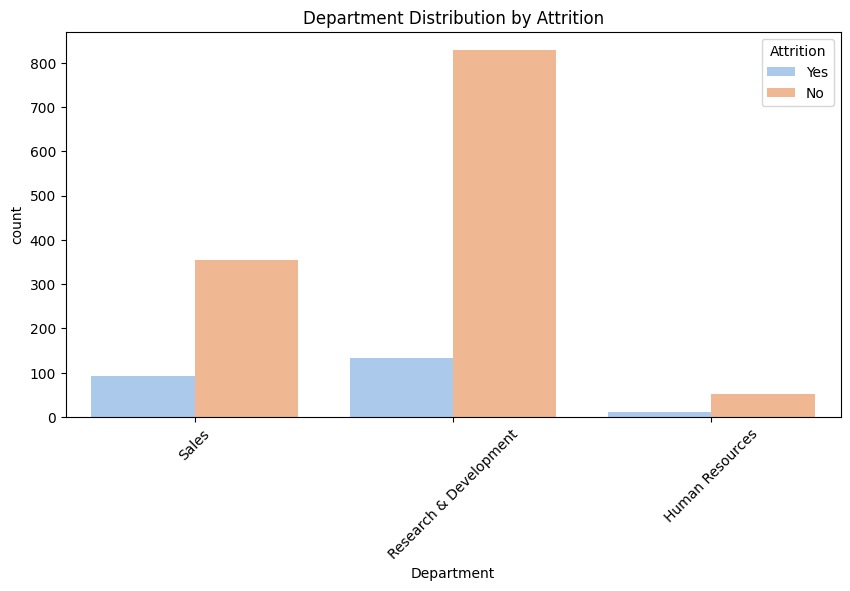

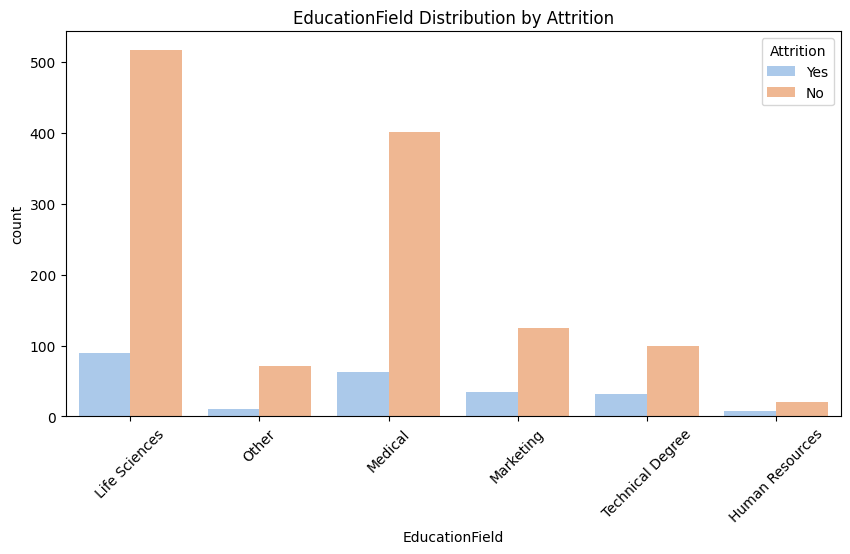

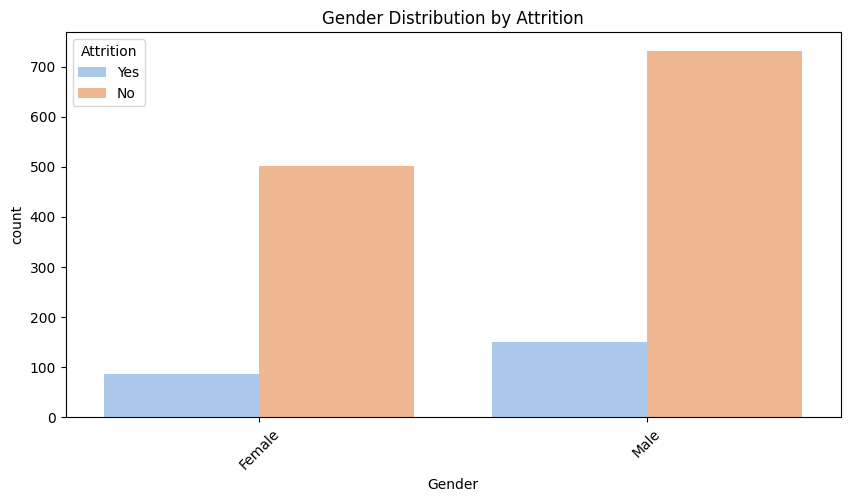

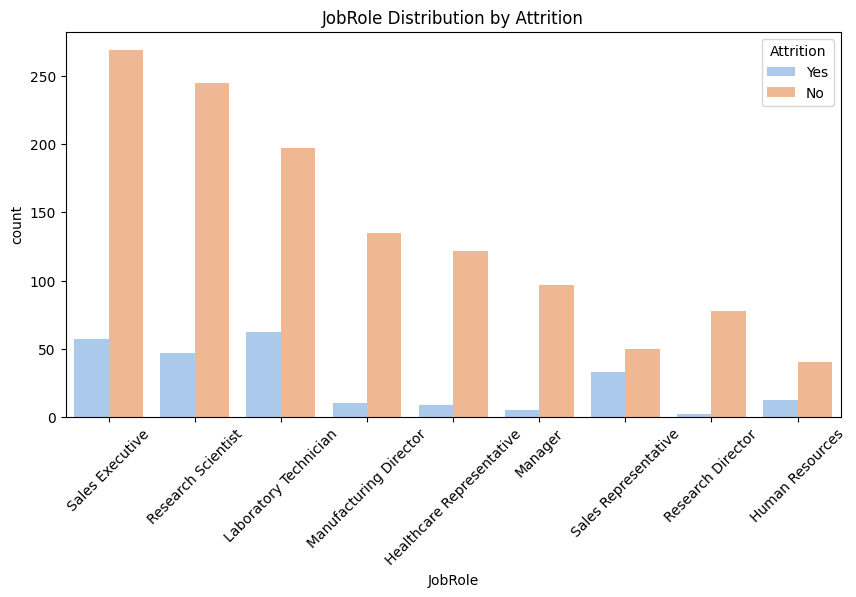

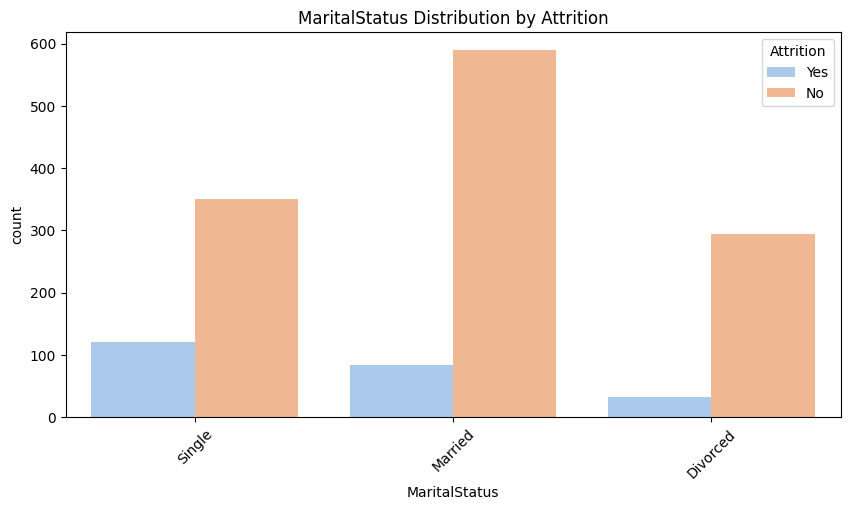

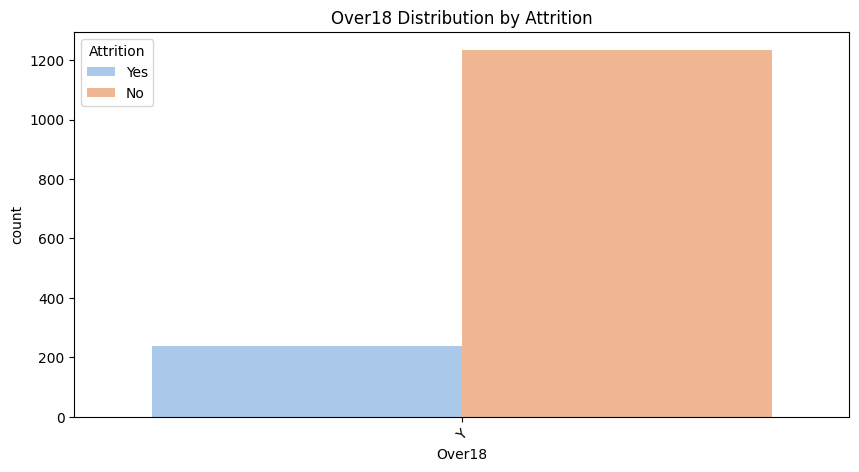

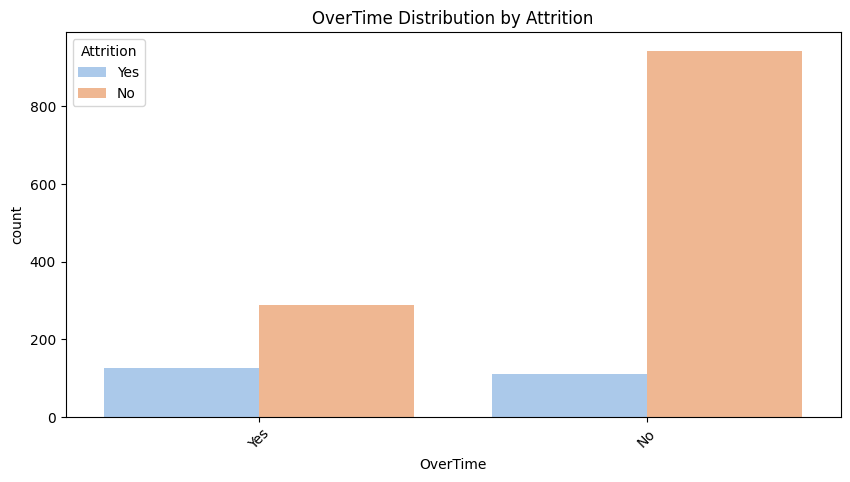

In [12]:
# Categorical feature analysis
categorical_features = data.select_dtypes(include=['object']).columns
for feature in categorical_features:
    if feature != 'Attrition':  # Exclude target variable
        plt.figure(figsize=(10, 5))
        sns.countplot(data=data, x=feature, hue='Attrition', palette='pastel')
        plt.title(f'{feature} Distribution by Attrition')
        plt.xticks(rotation=45)
        plt.show()


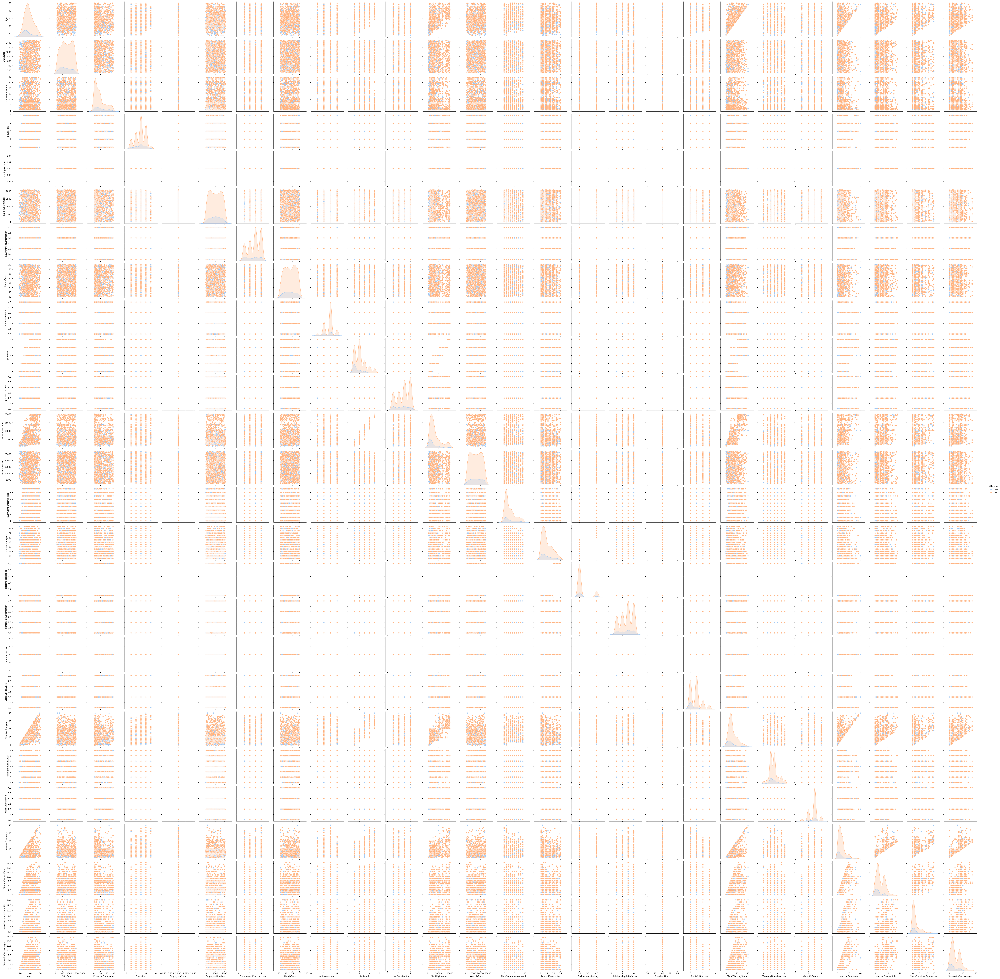

In [13]:
# Pairplot to visualize relationships between features
sns.pairplot(data, hue='Attrition', palette='pastel')
plt.show()


In [14]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Encode categorical features
label_encoders = {}
for col in data.select_dtypes(include=['object']).columns:
    label_encoders[col] = LabelEncoder()
    data[col] = label_encoders[col].fit_transform(data[col])

# Define features and target
X = data.drop('Attrition', axis=1)  # Replace 'Attrition' with the target column name
y = data['Attrition']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Train the Logistic Regression model
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# Make predictions
y_pred_logreg = logreg.predict(X_test)

# Evaluate the model
print("Logistic Regression Results:")
print("Accuracy:", accuracy_score(y_test, y_pred_logreg))
print("\nClassification Report:\n", classification_report(y_test, y_pred_logreg))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_logreg))


Logistic Regression Results:
Accuracy: 0.8469387755102041

Classification Report:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92       247
           1       1.00      0.04      0.08        47

    accuracy                           0.85       294
   macro avg       0.92      0.52      0.50       294
weighted avg       0.87      0.85      0.78       294


Confusion Matrix:
 [[247   0]
 [ 45   2]]


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [16]:
from sklearn.ensemble import RandomForestClassifier

# Train the Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Make predictions
y_pred_rf = rf.predict(X_test)

# Evaluate the model
print("Random Forest Results:")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))


Random Forest Results:
Accuracy: 0.8299319727891157

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.97      0.91       247
           1       0.38      0.11      0.17        47

    accuracy                           0.83       294
   macro avg       0.62      0.54      0.54       294
weighted avg       0.78      0.83      0.79       294


Confusion Matrix:
 [[239   8]
 [ 42   5]]


In [17]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Grid Search
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42),
                           param_grid=param_grid, cv=3, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

# Use the best model
best_rf = grid_search.best_estimator_


Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Best Score: 0.8639455782312925


X_test shape: (20, 5)
shap_values shape: (20, 5, 2)


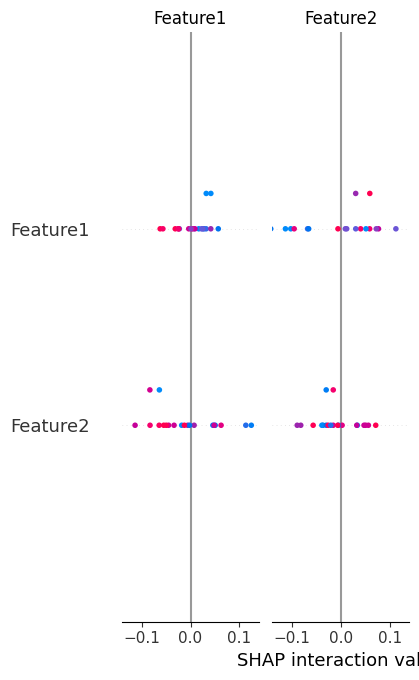

AssertionError: Mismatch: SHAP=10, Features=5

In [23]:
import shap

# Initialize the SHAP explainer
explainer = shap.TreeExplainer(rf)  # Works for tree-based models (e.g., Random Forest)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Debugging: Print shapes
print(f"X_test shape: {X_test.shape}")

if isinstance(shap_values, list):
    for i, sv in enumerate(shap_values):
        print(f"shap_values[{i}] shape: {sv.shape}")
else:
    print(f"shap_values shape: {shap_values.shape}")

# Fix for binary classification
if isinstance(shap_values, list) and len(shap_values) == 2:
    shap_summary_values = shap_values[1]  # Use only the positive class for visualization
else:
    shap_summary_values = shap_values

# Summary plot (global feature importance)
shap.summary_plot(shap_summary_values, X_test, plot_type="bar")

# Detailed explanation for a single prediction (local explanation)
index = 0  # Change this to the row index you want to explain

# **🔹 Fix: Handle Single-Class and Multi-Class Cases**
if isinstance(explainer.expected_value, list):  
    base_value = explainer.expected_value[1]  # Binary classification: use positive class
    shap_values_instance = shap_values[1][index]  # Extract the instance-level SHAP values
else:
    base_value = explainer.expected_value  # Single-class case
    shap_values_instance = shap_values[index]

# **🔹 Fix: Ensure Correct Input Format for SHAP v0.20+**
shap_values_instance = shap_values_instance.flatten()  # Ensure it's a 1D array

# Validate the shape before plotting
assert len(shap_values_instance) == X_test.shape[1], f"Mismatch: SHAP={len(shap_values_instance)}, Features={X_test.shape[1]}"

# 🛠️ **SHAP v0.20+ Fix for Force Plot**
shap.plots.force(base_value, shap_values_instance, X_test.iloc[index])


X_test shape: (20, 5)
shap_values shape: (20, 5, 2)


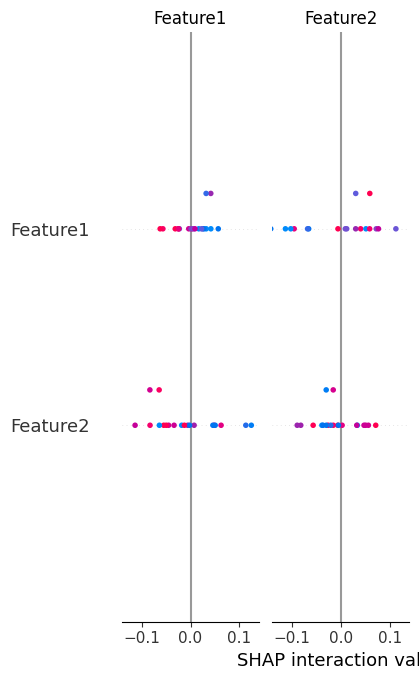

In [ ]:
import shap

# Initialize the SHAP explainer
explainer = shap.TreeExplainer(rf)  # Works for tree-based models (e.g., Random Forest)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Debugging: Print shapes to understand the structure
print(f"X_test shape: {X_test.shape}")

if isinstance(shap_values, list):
    for i, sv in enumerate(shap_values):
        print(f"shap_values[{i}] shape: {sv.shape}")
else:
    print(f"shap_values shape: {shap_values.shape}")

# Fix for binary classification (if list with 2 elements)
if isinstance(shap_values, list):
    shap_summary_values = shap_values[1]  # Positive class (for binary classification)
else:
    shap_summary_values = shap_values

# Summary plot (global feature importance)
shap.summary_plot(shap_summary_values, X_test, plot_type="bar")

# Detailed explanation for a single prediction (local explanation)
index = 0  # Change this to the row index you want to explain

# **🔹 Fix: Handle Single-Class and Multi-Class Cases**
if isinstance(explainer.expected_value, list):  
    base_value = explainer.expected_value[1]  # Binary classification: use positive class
    shap_values_instance = shap_values[1][index]  # Extract the instance-level SHAP values
else:
    base_value = explainer.expected_value  # Single-class case
    shap_values_instance = shap_values[index]

# Validate the number of features between X_test and SHAP values
assert X_test.shape[1] == shap_values_instance.shape[0], f"Mismatch: SHAP={shap_values_instance.shape[0]}, Features={X_test.shape[1]}"


In [27]:
from lime.lime_tabular import LimeTabularExplainer

# Initialize the LIME explainer
lime_explainer = LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=['No Attrition', 'Attrition'],  # Replace with your class names
    discretize_continuous=True
)

# Explain a single prediction
index = 0  # Replace with the row index you want to explain
lime_exp = lime_explainer.explain_instance(X_test.iloc[index].values, rf.predict_proba, num_features=10)

# Visualize the explanation
lime_exp.show_in_notebook()


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
